## Import neccesary packages

In [109]:
import pypsa
import matplotlib.pyplot as plt
plt.style.use('bmh')
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 600
import cartopy.crs as ccrs

# Optional, hide warnings
import warnings
warnings.filterwarnings("ignore")

import pandas as pd

## Select network to analyse

In [110]:
n = pypsa.Network("solved_network_with_chargers.nc")

INFO:pypsa.io:Imported network solved_network_with_chargers.nc has buses, carriers, generators, lines, links, loads, storage_units, stores


In [111]:
comp = pypsa.Network("solved_std_network.nc")

INFO:pypsa.io:Imported network solved_std_network.nc has buses, carriers, generators, lines, links, loads, storage_units, stores


# Visualization

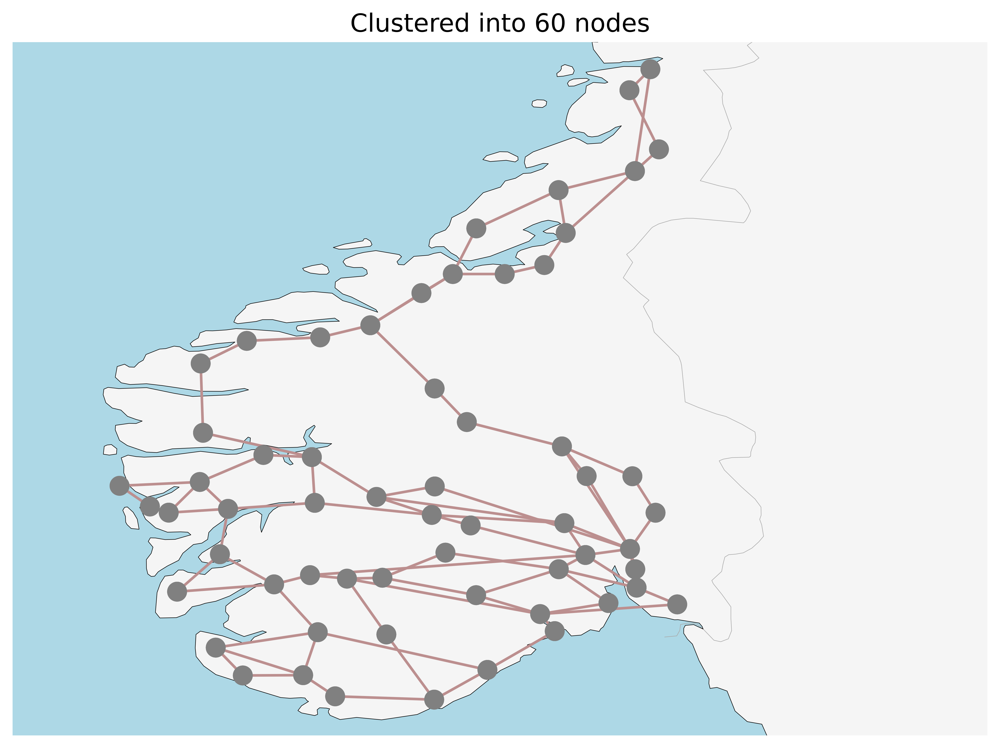

In [75]:
fif,ax = plt.subplots(
        figsize=(10,10),
        subplot_kw={"projection":ccrs.Orthographic()}
    )

n.plot(ax=ax,
       title="Clustered into 60 nodes",
       bus_colors="gray",
       branch_components=["Line"],
       #line_widths=n.lines.s_nom/10e2,
       #line_colors=loading,
       line_cmap=plt.cm.viridis,
       color_geomap=True,
       #bus_sizes=0
      )
ax.axis("off");

# Components

In [5]:
# Network with chargers
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Components '{}' has {} entries".format(c.name,len(c.df)))

Components 'Bus' has 288 entries
Components 'Carrier' has 17 entries
Components 'GlobalConstraint' has 1 entries
Components 'Line' has 131 entries
Components 'LineType' has 34 entries
Components 'TransformerType' has 14 entries
Components 'Link' has 384 entries
Components 'Load' has 88 entries
Components 'Generator' has 139 entries
Components 'StorageUnit' has 43 entries
Components 'Store' has 192 entries


In [8]:
# Comparison network
for c in comp.iterate_components(list(n.components.keys())[2:]):
    print("Components '{}' has {} entries".format(c.name,len(c.df)))

Components 'Bus' has 180 entries
Components 'Carrier' has 17 entries
Components 'Line' has 90 entries
Components 'LineType' has 34 entries
Components 'TransformerType' has 14 entries
Components 'Link' has 240 entries
Components 'Load' has 39 entries
Components 'Generator' has 119 entries
Components 'StorageUnit' has 40 entries
Components 'Store' has 120 entries


# Snapshots

In [30]:
#First snapshot
n.snapshots[1]

Timestamp('2013-01-02 00:00:00')

In [7]:
#Last snapshot
n.snapshots[-1]

Timestamp('2013-12-31 00:00:00')

In [33]:
len(n.snapshots)

365

In [12]:
len(n.snapshots)-len(comp.snapshots)

0

# Loads

Text(0.5, 1.0, 'Loads')

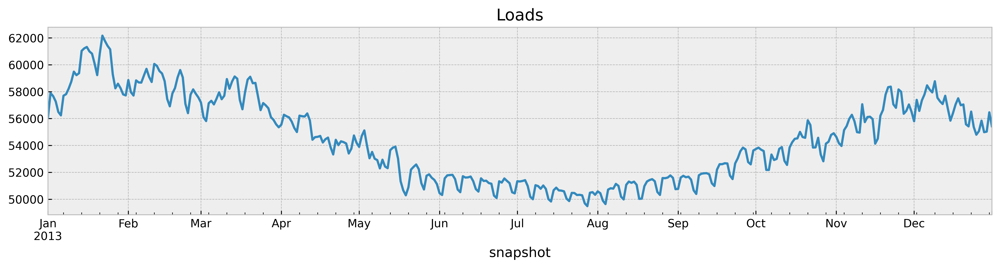

In [67]:
n.loads_t.p_set.sum(axis=1).plot(figsize=(15,3))
plt.title("Loads")

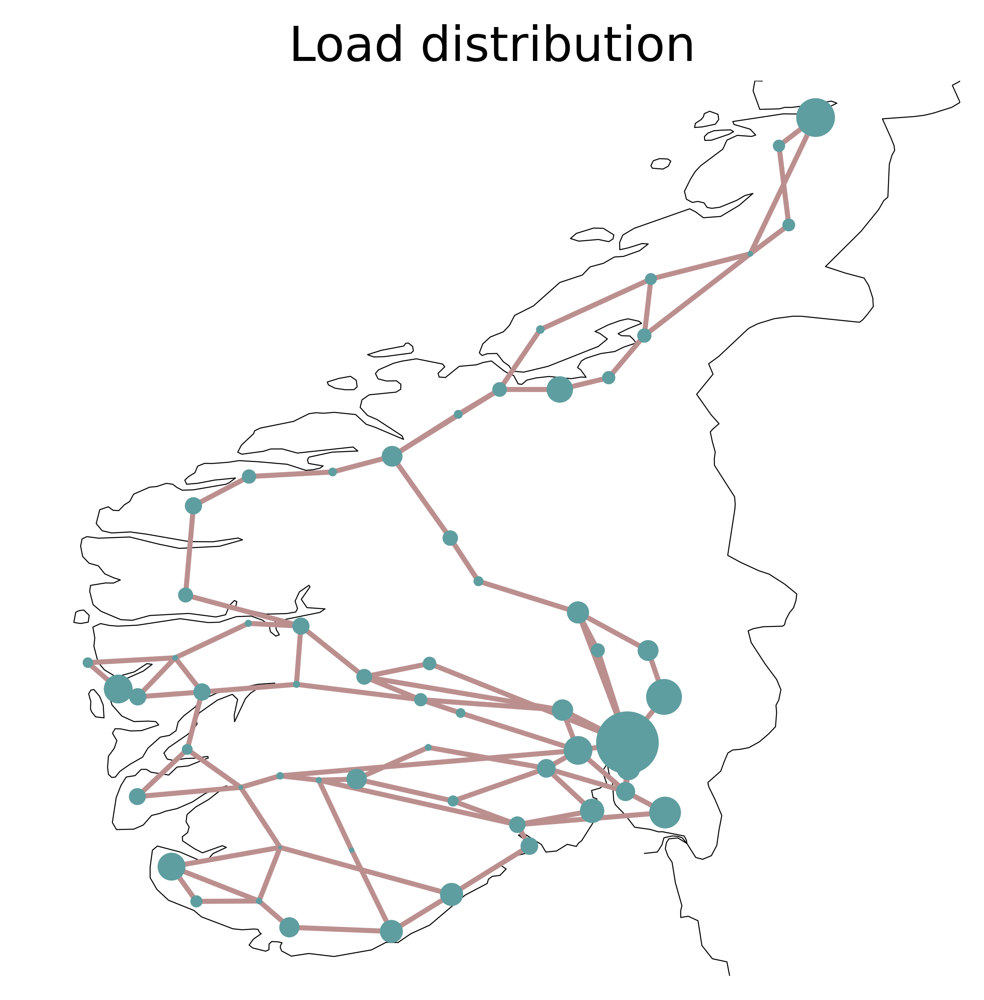

In [16]:
load = n.loads_t.p_set.sum(axis=0).groupby(n.loads.bus).sum()

fig = plt.figure()
ax = plt.axes(projection=ccrs.EqualEarth())

n.plot(
    ax=ax,
    bus_sizes=load / 0.3e8,
    title = "Load distribution"
);

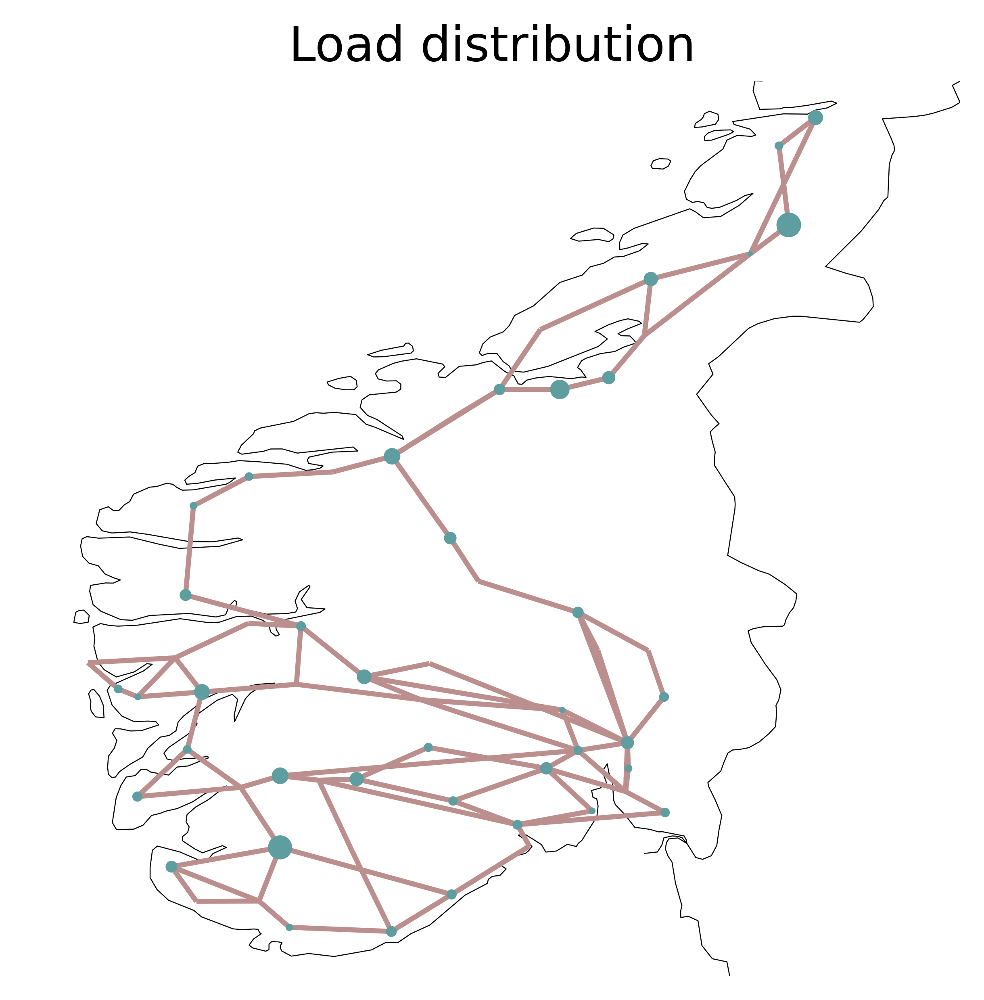

In [17]:
load = comp.loads_t.p_set.sum(axis=0).groupby(n.loads.bus).sum()

fig = plt.figure()
ax = plt.axes(projection=ccrs.EqualEarth())

n.plot(
    ax=ax,
    bus_sizes=load / 0.3e8,
    title = "Load distribution"
);

## Line Loading

In [18]:
n.snapshots[20]

Timestamp('2013-01-21 00:00:00')

In [49]:
n.snapshots[210]

Timestamp('2013-07-30 00:00:00')

In [28]:
jan21 = n.snapshots[20]

In [51]:
july30 = n.snapshots[20]

In [53]:
loading_n_jan21 = n.lines_t.p0.loc[jan21] / n.lines.s_nom
loading_n_july30 = n.lines_t.p0.loc[july30] / n.lines.s_nom
loading_comp_jan21 = comp.lines_t.p0.loc[jan21] / comp.lines.s_nom
loading_comp_july30 = comp.lines_t.p0.loc[july30] / comp.lines.s_nom

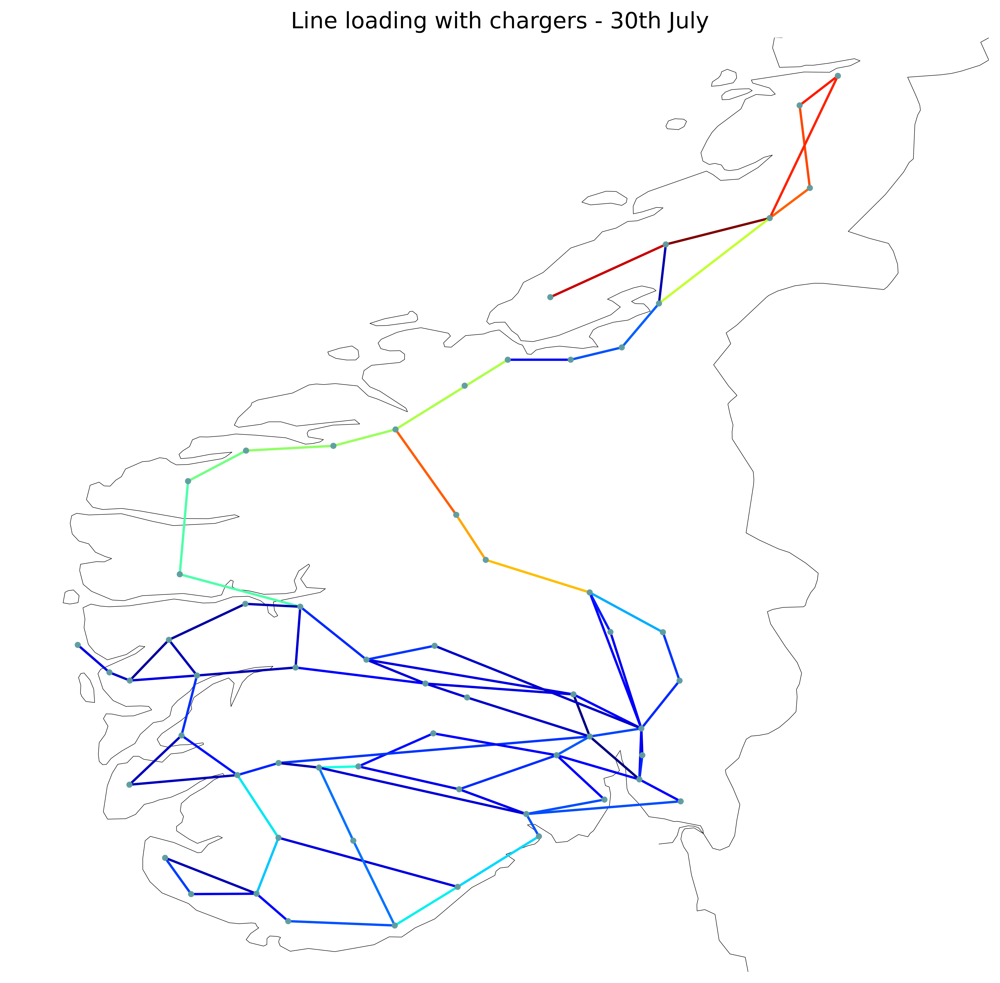

In [78]:
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(9, 9))
n.plot(
    ax=ax,
    line_colors=abs(loading_n_july30),
    line_cmap=plt.cm.jet,
    title="Line loading with chargers - 30th July",
    bus_sizes=1e-3,
    bus_alpha=0.7,
)
fig.tight_layout()

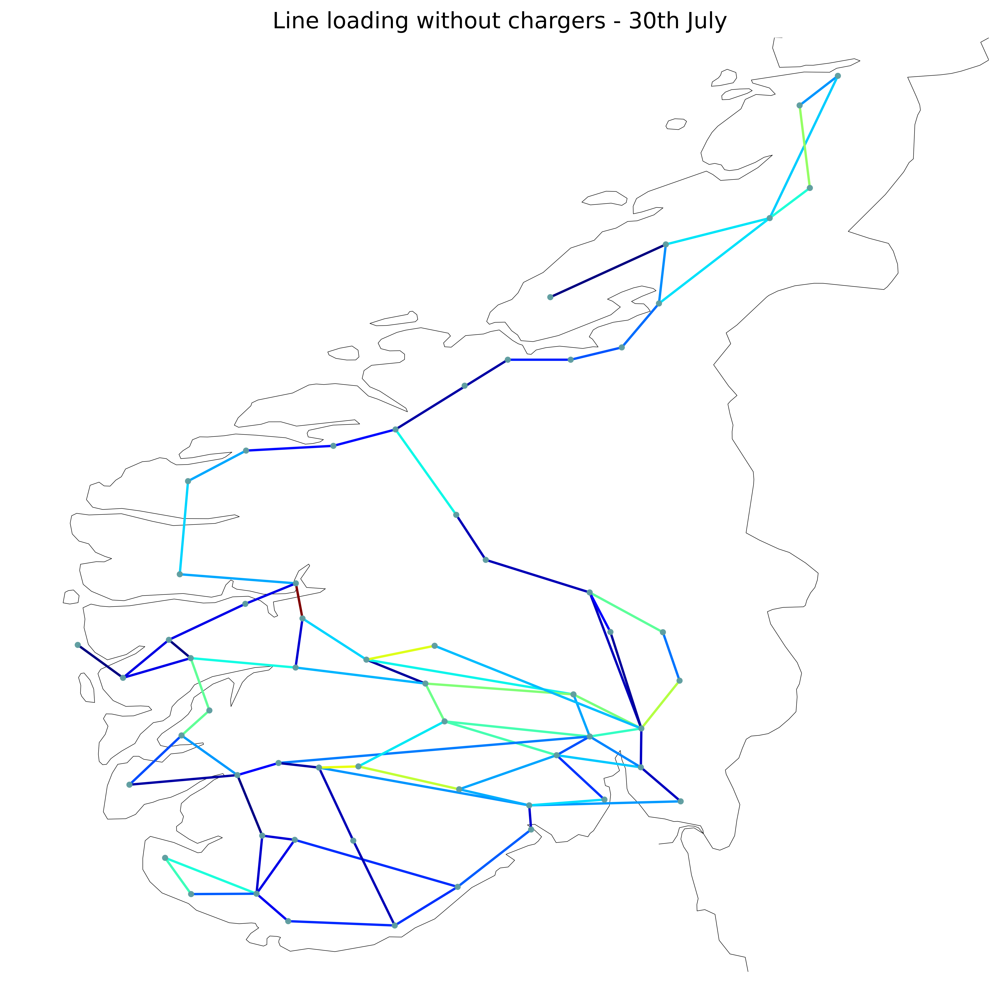

In [79]:
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.EqualEarth()}, figsize=(9, 9))
comp.plot(
    ax=ax,
    line_colors=abs(loading_comp_july30),
    line_cmap=plt.cm.jet,
    title="Line loading without chargers - 30th July",
    bus_sizes=1e-3,
    bus_alpha=0.7,
)
fig.tight_layout();

Average price:  1.0523807651645067


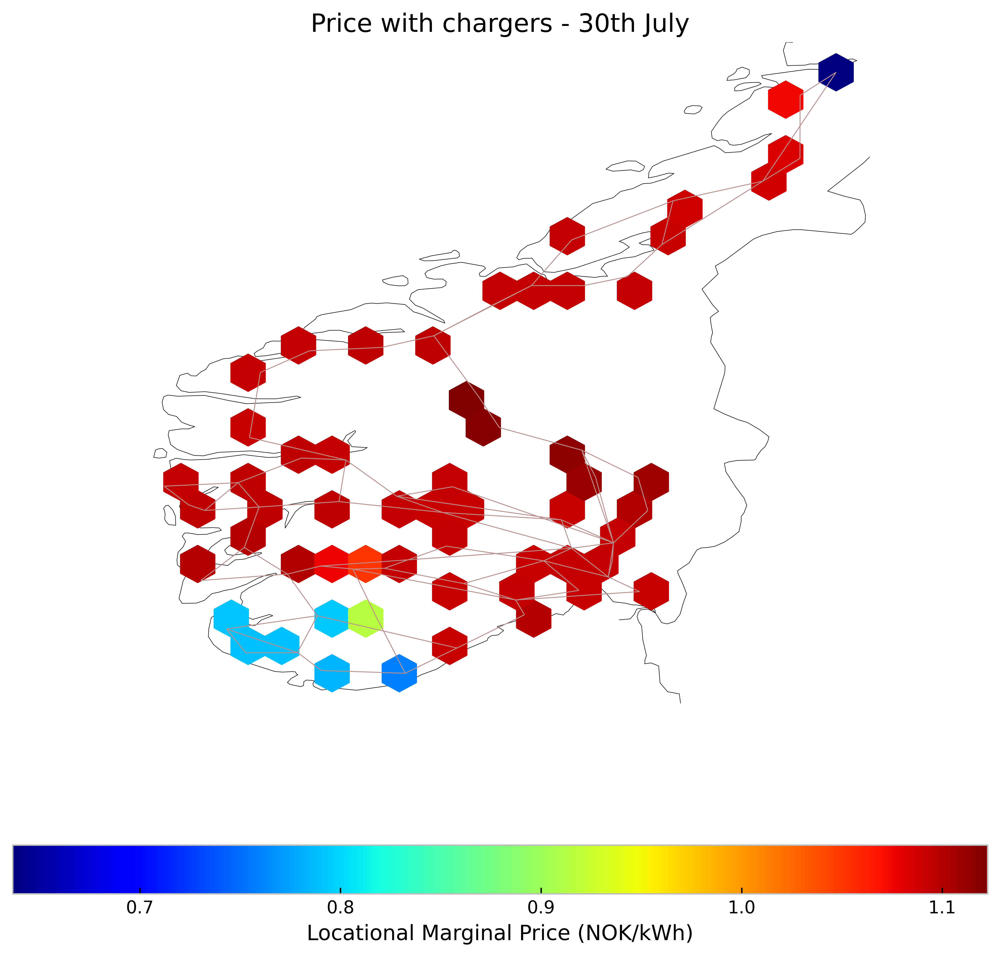

In [80]:
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))
plt.hexbin(
    n.buses.x,
    n.buses.y,
    gridsize=20,
    C=n.buses_t.marginal_price.loc[july30]/1000*11.5,
    cmap=plt.cm.jet,
    zorder=3,
)
n.plot(ax=ax, line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0, title="Price with chargers - 30th July")

cb = plt.colorbar(location="bottom")
cb.set_label("Locational Marginal Price (NOK/kWh)")
fig.tight_layout()
print("Average price: ",n.buses_t.marginal_price.loc[july30].sum()/1000*11.5/len(n.buses))

Average price:  0.37754806826001547


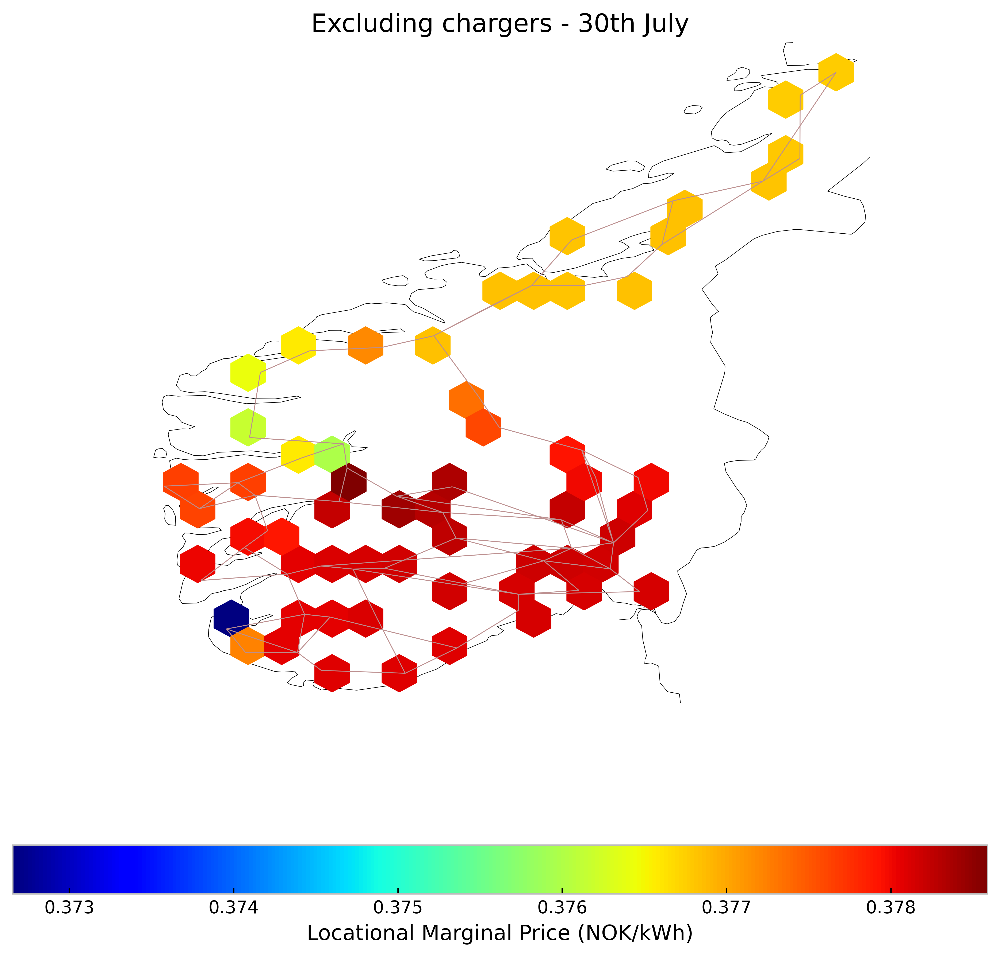

In [81]:
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))

plt.hexbin(
    comp.buses.x,
    comp.buses.y,
    gridsize=20,
    C=comp.buses_t.marginal_price.loc[july30]/1000*11.5,
    cmap=plt.cm.jet,
    zorder=3,
)
comp.plot(ax=ax, line_widths=pd.Series(0.5, comp.lines.index), bus_sizes=0, title="Excluding chargers - 30th July")

cb = plt.colorbar(location="bottom")
cb.set_label("Locational Marginal Price (NOK/kWh)")
fig.tight_layout()
print("Average price: ",comp.buses_t.marginal_price.loc[july30].sum()/1000*11.5/len(comp.buses))

In [99]:
print("Avg price comp: ",comp.buses_t.marginal_price.loc[jan21].sum()/1000*11.5/len(comp.buses))
print("Avg price chargers: ",n.buses_t.marginal_price.loc[jan21].sum()/1000*11.5/len(n.buses))

Avg price comp:  0.37754806826001547
Avg price chargers:  1.0523807651645067


### Transmission Line Expansion

In [100]:
(n.lines.s_nom_opt - n.lines.s_nom).sum()/1000

471.9666033358138

In [101]:
(comp.lines.s_nom_opt - comp.lines.s_nom).sum()/1000

1.109309335639086

Text(0.5, 1.0, 'Line expansion')

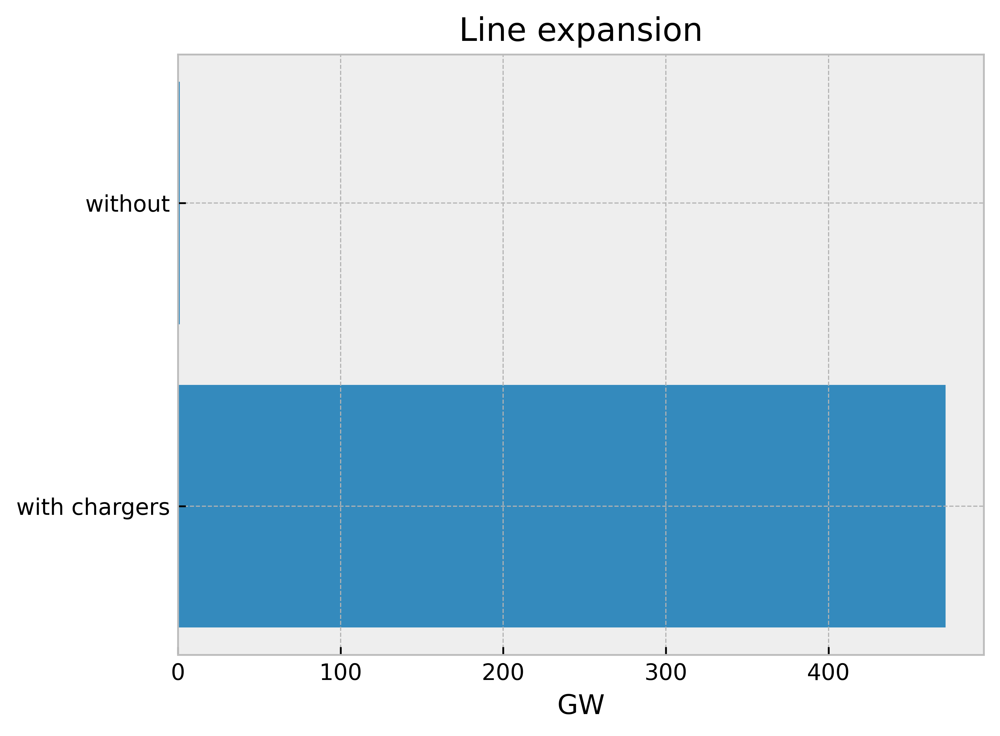

In [102]:
line_exp = [(n.lines.s_nom_opt - n.lines.s_nom).sum()/1000, (comp.lines.s_nom_opt - comp.lines.s_nom).sum()/1000]   # /1000 for converting to GW
bars = ("with chargers", "without")

df = pd.DataFrame ({
        'Group':  bars,
        'Value': line_exp
})
plt.barh(y=df.Group, width=df.Value)
plt.xlabel('GW')
plt.title("Line expansion")

# Objective value

In [107]:
# Unsolved network, no objective value
n.objective / 1e9 * 11.5 # Billion NOK p.a

282.06063829323637

### Optimal Generator/Storage Capacities

In [61]:
n.generators.groupby("carrier").p_nom_opt.sum()/1e3 #GW

carrier
CCGT            0.638000
offwind-ac      2.463237
offwind-dc      1.052374
onwind        142.647462
ror             0.210500
solar          89.604072
Name: p_nom_opt, dtype: float64

Text(0.5, 1.0, 'Optimal power capacity needed for the chargers')

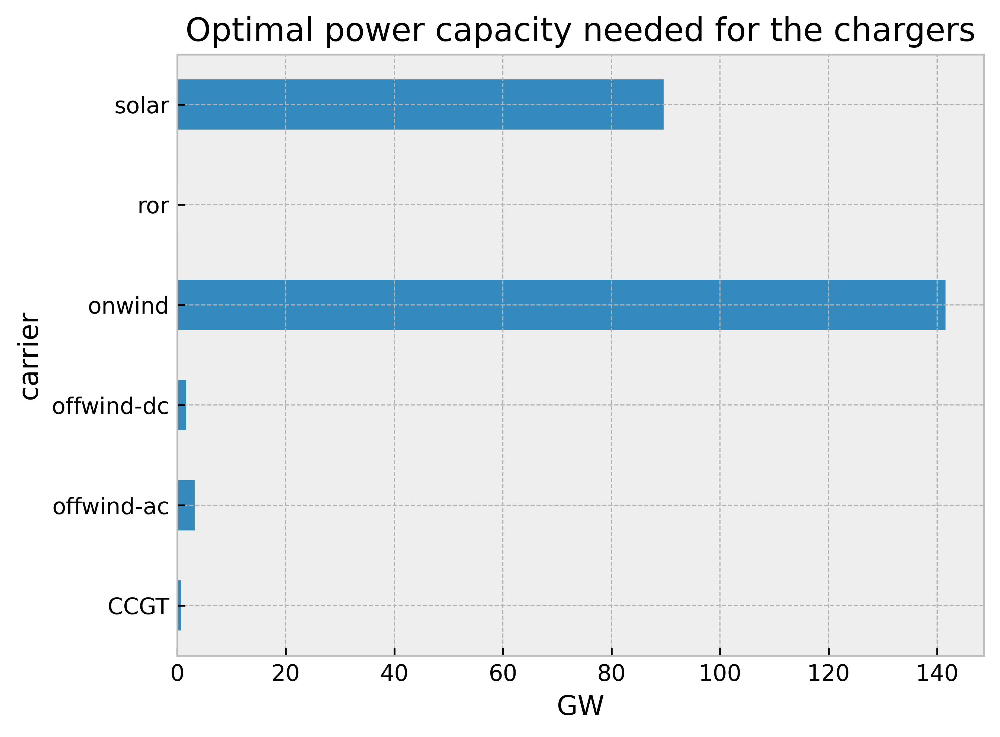

In [115]:
n.generators.groupby("carrier").p_nom_opt.sum().div(1e3).plot.barh()
plt.xlabel('GW')
plt.title("Optimal power capacity needed for the chargers")

In [62]:
n.storage_units.groupby("carrier").p_nom_opt.sum()

carrier
PHS        282.3000
hydro    28834.0802
Name: p_nom_opt, dtype: float64

Text(0.5, 1.0, 'Optimal power capacity needed for the chargers')

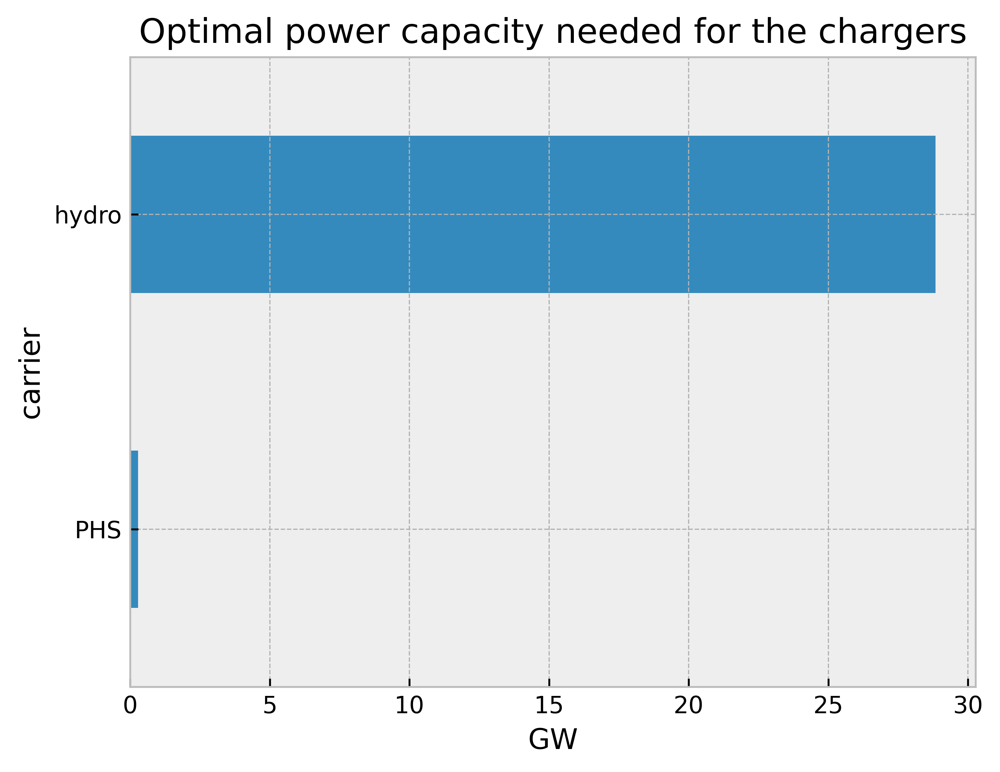

In [117]:
n.storage_units.groupby("carrier").p_nom_opt.sum().div(1e3).plot.barh()
plt.xlabel('GW')
plt.title("Optimal power capacity needed for the chargers")

### Energy storage

<AxesSubplot:xlabel='snapshot'>

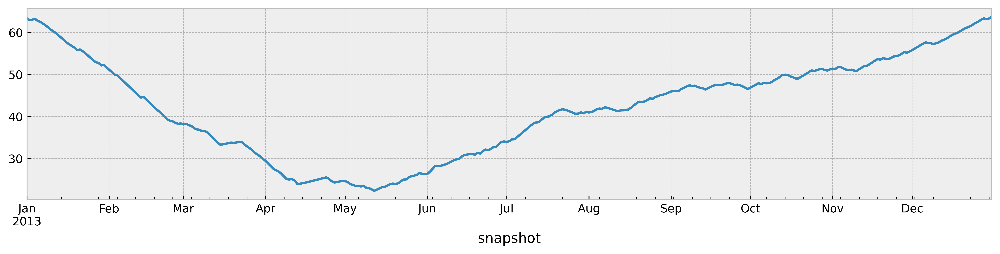

In [73]:
(n.storage_units_t.state_of_charge.sum(axis=1).resample('D').mean() / 1e6).plot(figsize=(15,3))

<AxesSubplot:xlabel='snapshot'>

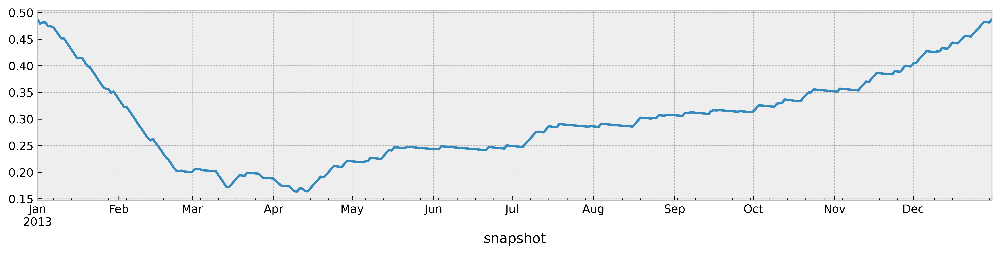

In [113]:
(n.storage_units_t.state_of_charge.filter(like="PHS",axis=1).sum(axis=1)/1e6).plot(figsize=(15,3))

<AxesSubplot:xlabel='snapshot'>

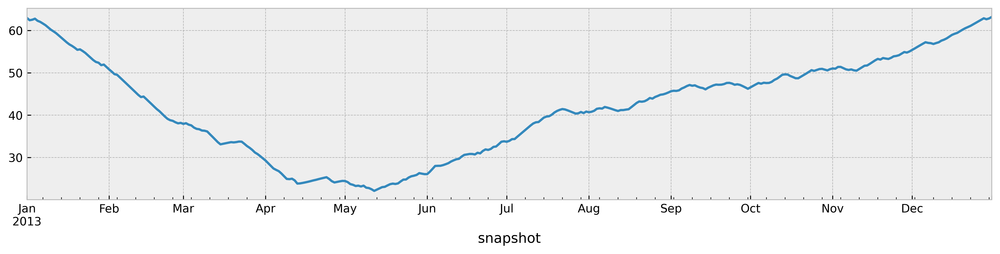

In [72]:
(n.storage_units_t.state_of_charge.filter(like="hydro",axis=1).sum(axis=1)/1e6).plot(figsize=(15,3))